# Sentinel Hub - Satellite Images

https://sentinelhub-py.readthedocs.io/en/latest/


https://sentinelhub-py.readthedocs.io/en/latest/examples/ogc_request.html

## 1. Setting Credentials

First we need to set the credentials.

In [6]:
import json

with open('sentinel_keys.json') as f:
    keys = json.load(f)

In [7]:
from sentinelhub import SHConfig

INSTANCE_ID = keys['INSTANCE_ID']
CLIENT_ID = keys['CLIENT_ID']
CLIENT_SECRET = keys['CLIENT_SECRET']


config = SHConfig()

if CLIENT_ID and CLIENT_SECRET:
    config.instance_id = INSTANCE_ID
    config.sh_client_id = CLIENT_ID
    config.sh_client_secret = CLIENT_SECRET
    print('SUCCESSFUL LOGIN')

if config.sh_client_id == '' or config.sh_client_secret == '':
    print("Warning! To use Sentinel Hub services, please provide the credentials (client ID and client secret).")

SUCCESSFUL LOGIN


## 2. Imports

We need to import some dependencies in order to obtain, process and plot satellite images.

In [8]:
import datetime
import numpy as np
import matplotlib.pyplot as plt

from sentinelhub import WmsRequest, WcsRequest, MimeType, CRS, BBox, DataCollection

In [9]:
def plot_image(image, title, factor=1):
    """
    Utility function for plotting RGB images.
    """
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 7))

    if np.issubdtype(image.dtype, np.floating):
        plt.imshow(np.minimum(image * factor, 1))
    else:
        plt.imshow(image)
        
    fig.suptitle(title, fontsize=15)

    ax.set_xticks([])
    ax.set_yticks([])

## 3. Set area of interest

We have to set an area of interest defined by it's coordinates in WGS84 coordinate system (longitude and latitude coordinates of upper left and lower right corners).

```
WGS84 = (upper_left_longitude, upper_left_latitude, lower_right_longitude, lower_right_latitude)
```

In [10]:
# Betsiboka Estuary 
interest_coords = [45.88, -16.12, 47.29, -15.45]
interest_bbox = BBox(bbox=interest_coords, crs=CRS.WGS84)

## 4. Get single image

We need to specify some parameters to the request:
- `layer`: layer configured at SentinelHub Configurator https://apps.sentinel-hub.com/configurator/
- `bbox`: bbox determined by the coordinates 
- `time`: acquisition date
- `width`: width of the returned image
- `config`: credentials

In [11]:
wms_true_color_request = WmsRequest(
    data_collection=DataCollection.SENTINEL2_L1C,
    layer='TRUE-COLOR-S2-L1C',
    bbox=interest_bbox,
    time='2017-12-05',
    width=960,
    image_format=MimeType.PNG,
    config=config
)

In [12]:
# Get Image
wms_true_color_img = wms_true_color_request.get_data()

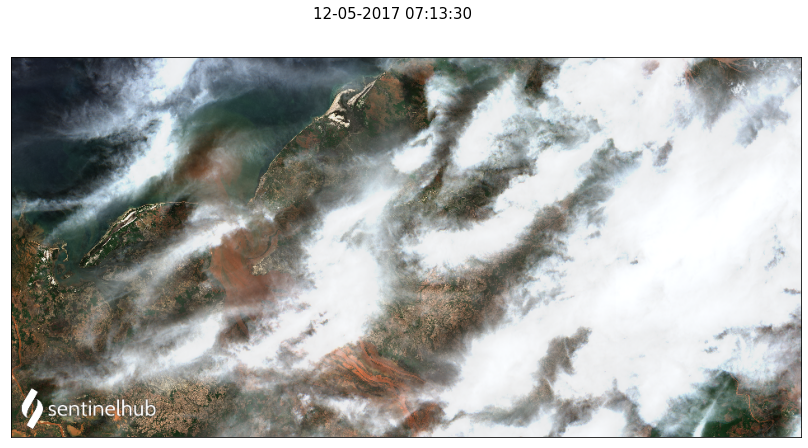

In [13]:
# Plot Image
date = wms_true_color_request.get_dates()[0].strftime("%m-%d-%Y %H:%M:%S")
plot_image(wms_true_color_img[0], title=date)

## 5. Get Images between dates

In addition to the parameters explained above, we need to add:
- `time`: this time we give a set interval of dates
- `time_difference`: time interval in which two or more download requests are considered to be the same.

In [14]:
wms_true_color_request = WmsRequest(
    data_collection=DataCollection.SENTINEL2_L1C,
    layer='TRUE-COLOR-S2-L1C',
    bbox=interest_bbox,
    time=('2020-12-01','2021-01-18'),
    width=960,
    time_difference=datetime.timedelta(hours=2),
    config=config
)

In [15]:
wms_true_color_img = wms_true_color_request.get_data()

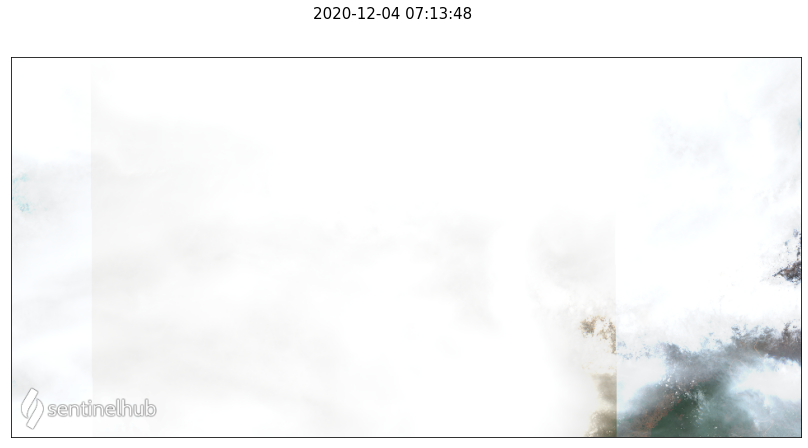

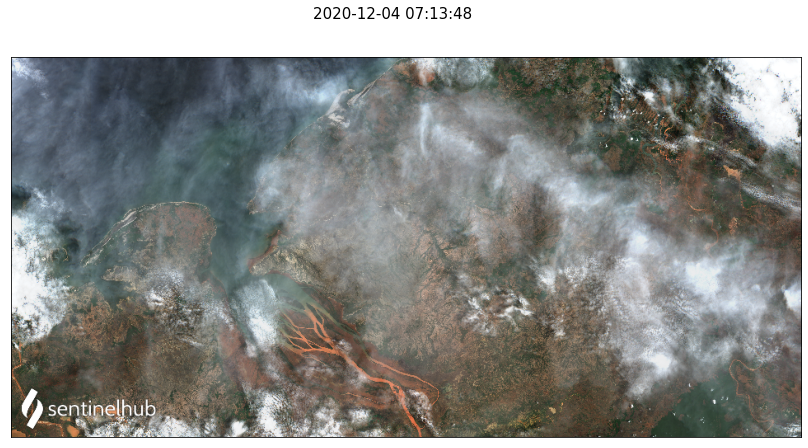

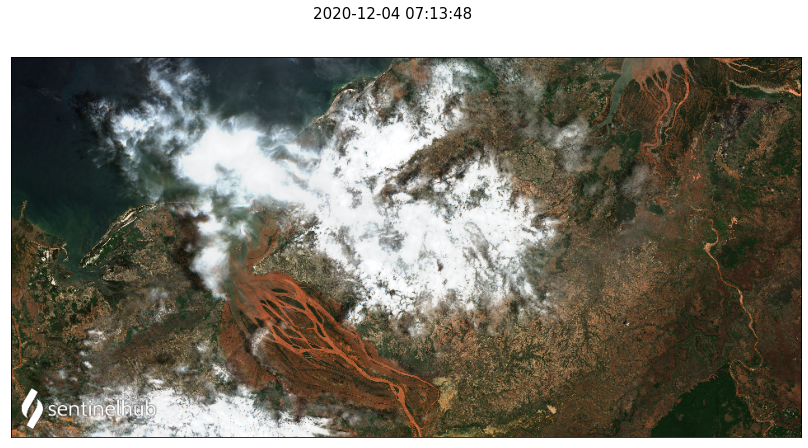

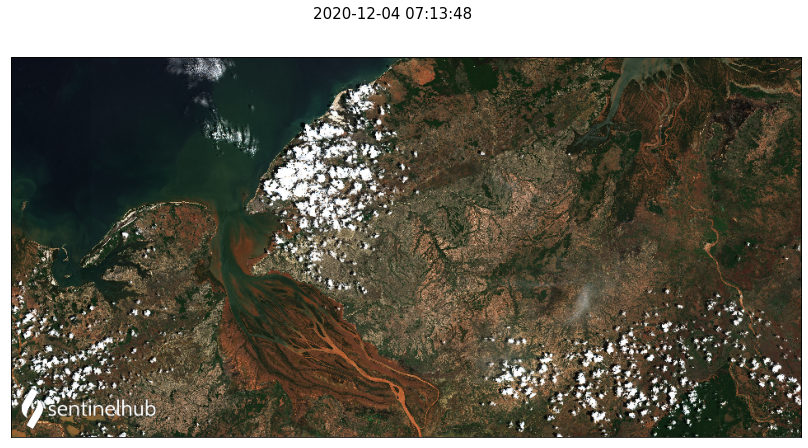

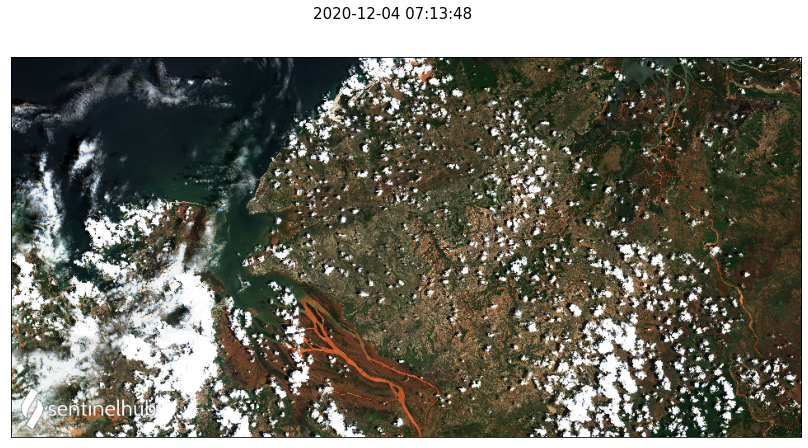

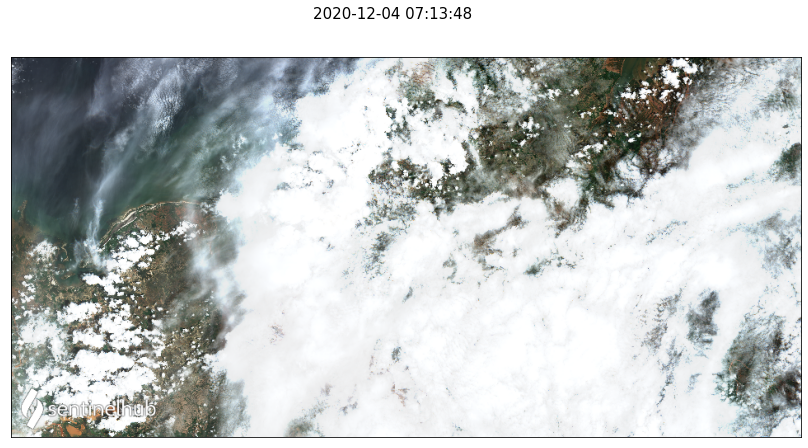

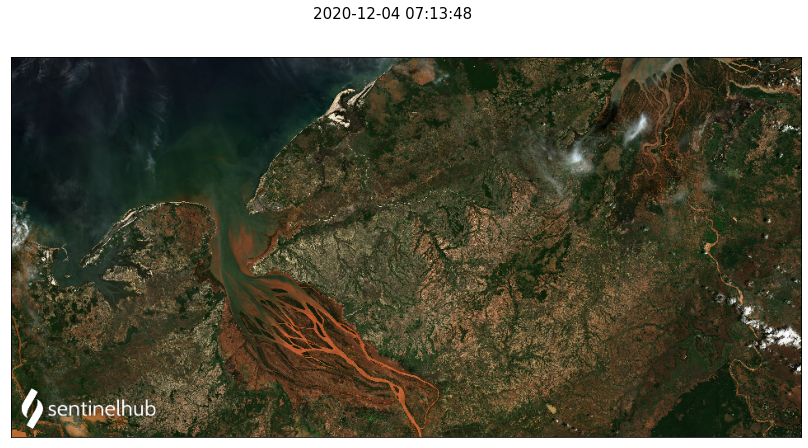

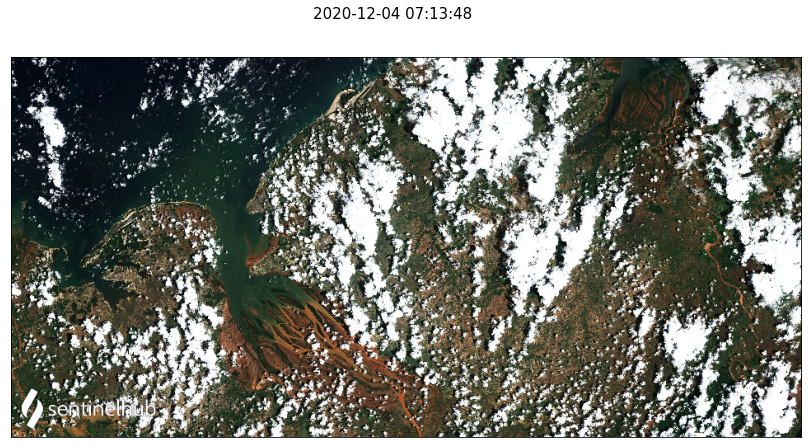

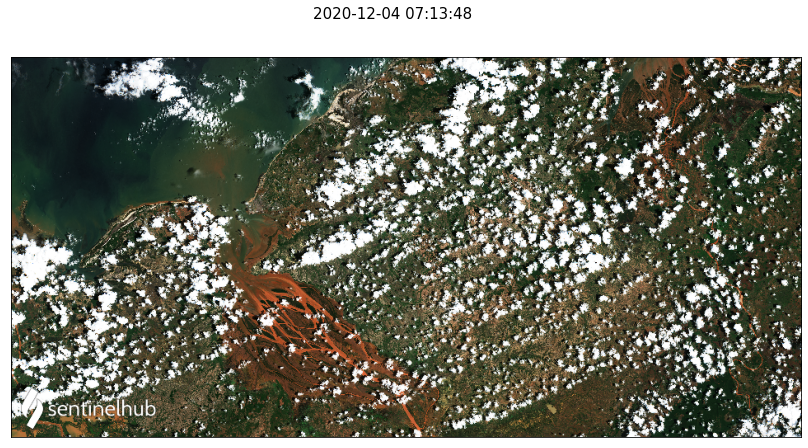

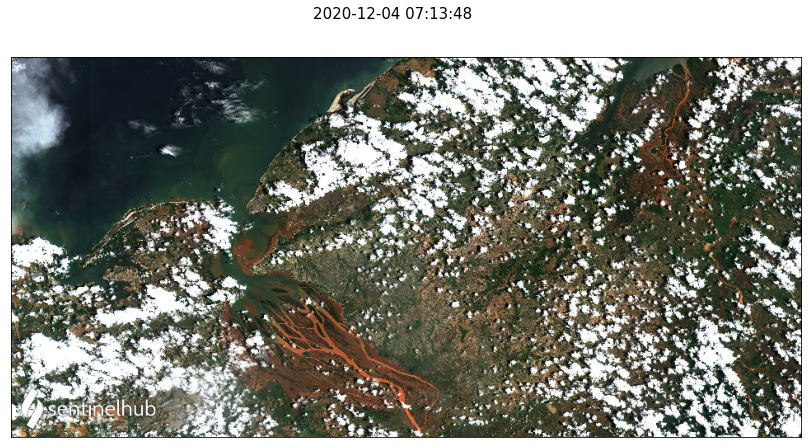

In [16]:
for i in range(len(wms_true_color_img)):
    date = wms_true_color_request.get_dates()[0].strftime("%Y-%m-%d %H:%M:%S")
    plot_image(wms_true_color_img[i], title=date)

## 6. Set max cloud coverage

To determine the maximum cloud coverage we can use the following parameter. Note that the API will returned cropped areas on the images if they exceed the cloud threshold.
- `maxcc`: maximum value in percentage of cloud coverage on Sentinel-2 tile.

In [17]:
wms_true_color_request = WmsRequest(
    data_collection=DataCollection.SENTINEL2_L1C,
    layer='TRUE-COLOR-S2-L1C',
    bbox=interest_bbox,
    time=('2020-12-01','2021-01-18'),
    maxcc=0.3,
    width=960,
    time_difference=datetime.timedelta(hours=2),
    config=config
)

In [18]:
wms_true_color_img = wms_true_color_request.get_data()

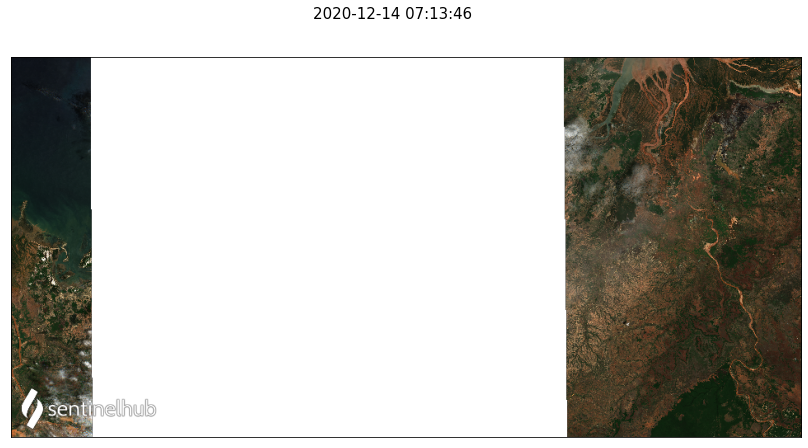

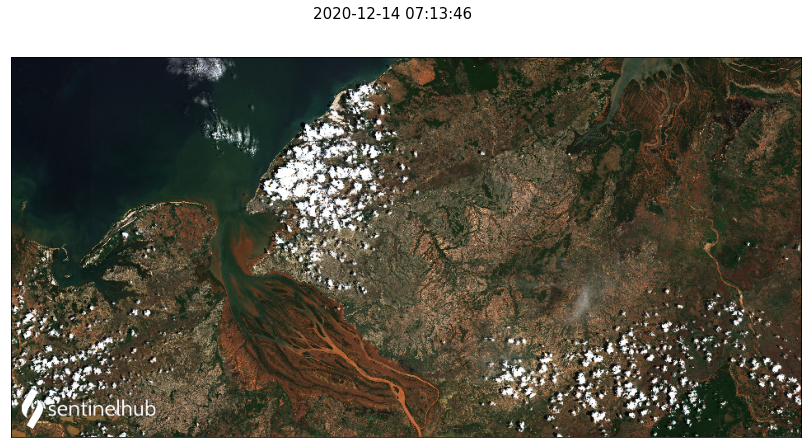

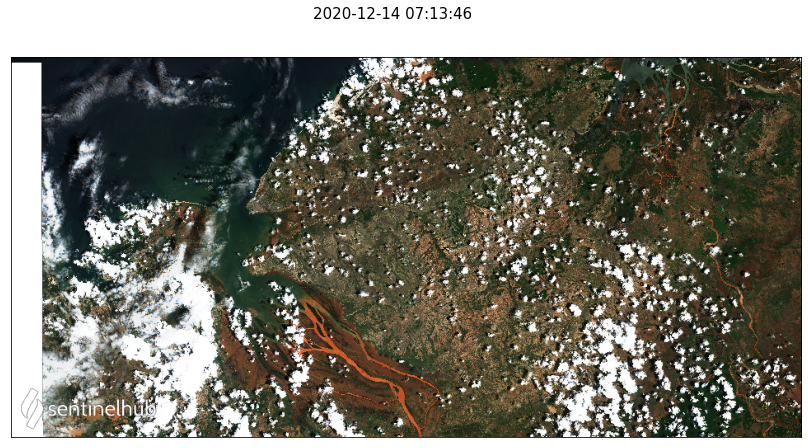

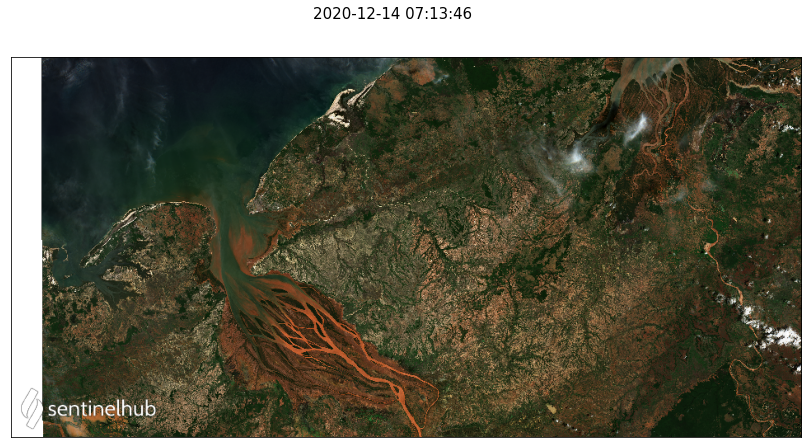

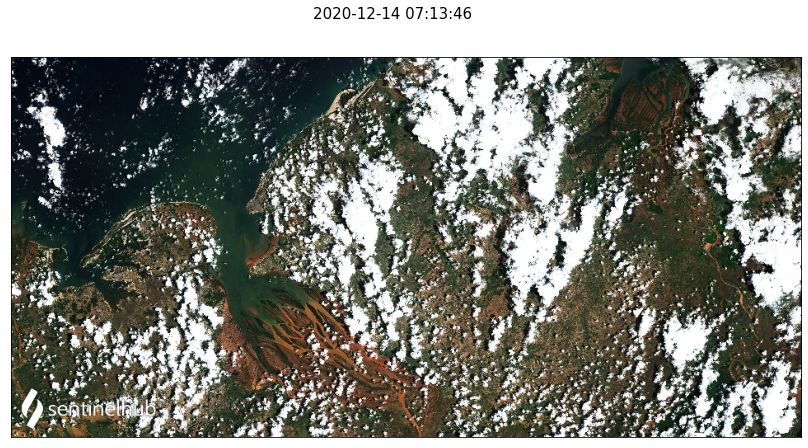

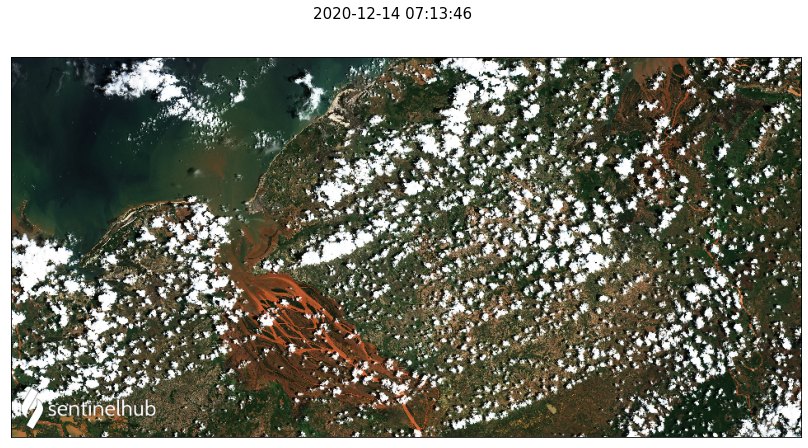

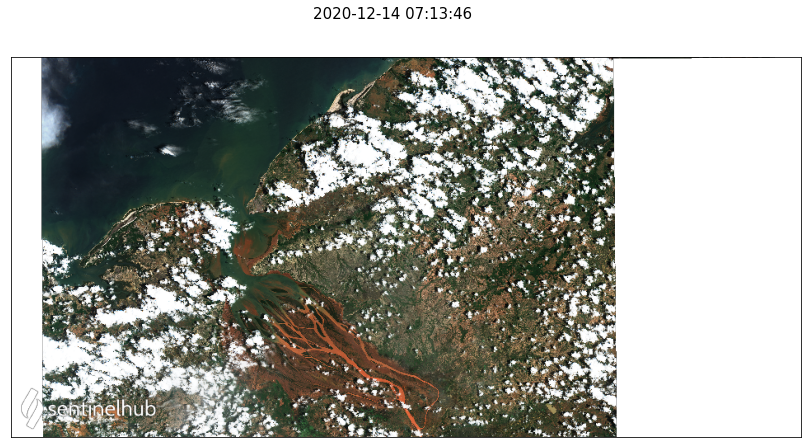

In [19]:
for i in range(len(wms_true_color_img)):
    date = wms_true_color_request.get_dates()[0].strftime("%Y-%m-%d %H:%M:%S")
    plot_image(wms_true_color_img[i], title=date)

## 7. Save downloaded images

Finally, to save the downloaded images to disk we need the following parameters:
- `data_folder`: folder to save the images
- `image_format`: PNG, JPEG, etc.

At the method `.get_data()` we need to activate the parameter `save_data=True`


In [20]:
wms_true_color_request = WmsRequest(
    data_collection=DataCollection.SENTINEL2_L1C,
    layer='TRUE-COLOR-S2-L1C',
    data_folder='satellite_images',
    bbox=interest_bbox,
    time=('2020-12-01','2021-01-18'),
    width=960,
    image_format=MimeType.PNG,
    time_difference=datetime.timedelta(hours=2),
    config=config
)

In [21]:
wms_true_color_img = wms_true_color_request.get_data(save_data=True)
print(f'Saved {len(wms_true_color_img)} images')

Saved 10 images
